In [ ]:
import os
import sys
sys.path.append("../")
import pickle
import torch

import matplotlib.pyplot as plt

from detectron2.structures.boxes import Boxes

from codes.video_handling import videoObj
from codes.utils.img_utils import add_bboxes_on_image

from codes.utils.evaluation import filter_preds_score_image, filter_preds_score_video, CfnMat, filter_annot_margin_video, filter_gt_margin_image

from codes.utils.time_consist import (apply_time_consistency, filter_pipes, pipe_to_frame_instances,
                                tube_space_time, video_phaseCorrelation)

import copy

In [85]:
video_name = '20191031_rectified_DJI_0082'
train_set =  'train+val'
obj = 'tire'
model_iter = 'final'

video_path = f"../data/v1/videos/{video_name}.avi"
pred_file = f"../output/v1_new_final/faster_rcnn_R_50_FPN_1x/mbg_{train_set}_{obj}/{video_name}_preds_model_{model_iter}.pkl"

vid = videoObj(video_path, video_path.replace(".avi", ".xml").replace('videos', 'annotation'))

with open(pred_file, 'rb') as pkl_file:
    preds_loaded = pickle.load(pkl_file)

In [86]:
def get_pred_boxes_frame(preds, frame_idx):
    instances = preds[f'frame_{frame_idx:04d}']['instances']     
    return instances#.get('pred_boxes').to(device='cpu')

def make_boxes(ann):
    l = []
    for b in ann.values():        
#         t = torch.Tensor(b)
        l.append(b)    
    out = Boxes(torch.Tensor(l))
    
    return out

def get_labels(gt):
    lbls = []
    for l in gt.keys():
        lbls.append(l.split('-')[0])
        
    return lbls

2496
{}
Boxes(tensor([[3908.1279, 1802.3969, 3950.4468, 1847.4453]]))
tp=0, fp=1, fn=0


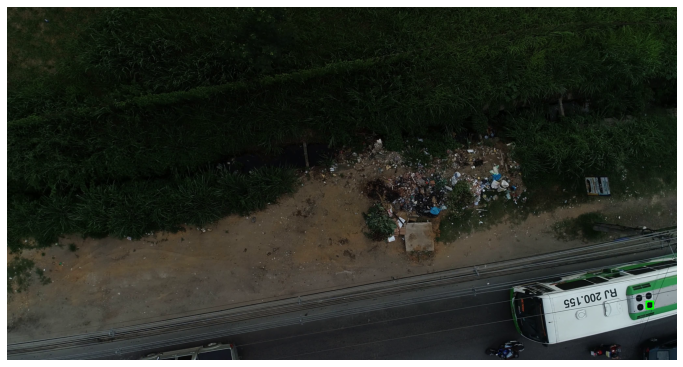

2544
{}
Boxes(tensor([[3742.1887, 2117.4150, 3790.5564, 2160.0000]]))
tp=0, fp=1, fn=0


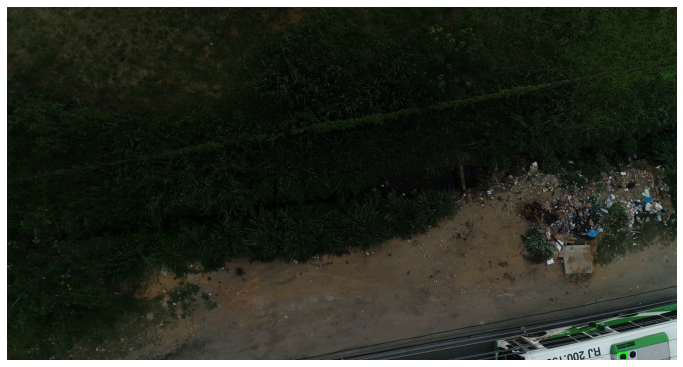

2760
{'tire-001': [923, 271, 1003, 349]}
Boxes(tensor([[ 915.4645,  269.0190, 1002.4479,  347.4685]]))
tp=1, fp=0, fn=0


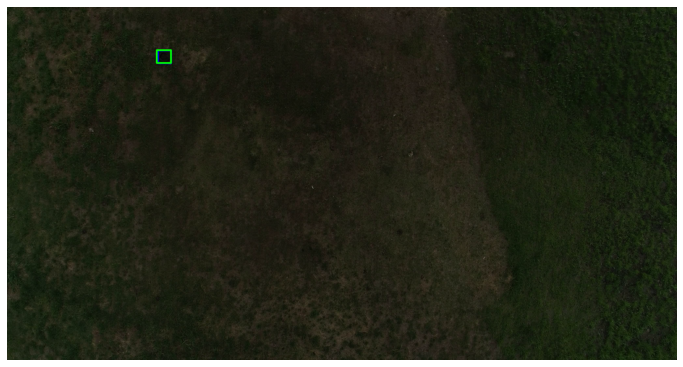

2784
{'tire-001': [892, 768, 974, 846]}
Boxes(tensor([[888.8231, 764.5649, 975.1307, 844.9895]]))
tp=1, fp=0, fn=0


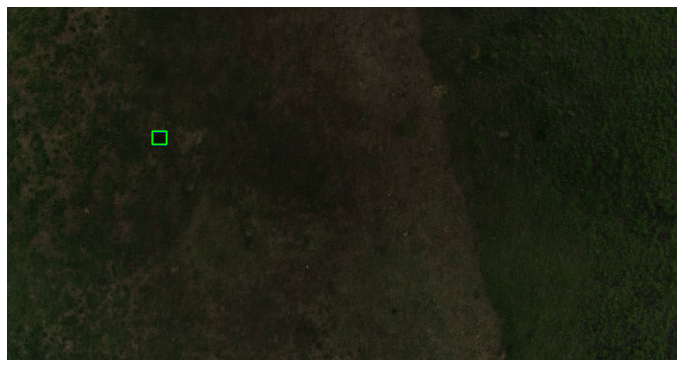

2808
{'tire-001': [865, 1261, 947, 1338], 'tire-004': [1743, 381, 1824, 459]}
Boxes(tensor([[ 861.6387, 1258.1057,  948.0215, 1336.0896],
        [1745.0087,  380.2699, 1821.2168,  456.6116]]))
tp=2, fp=0, fn=0


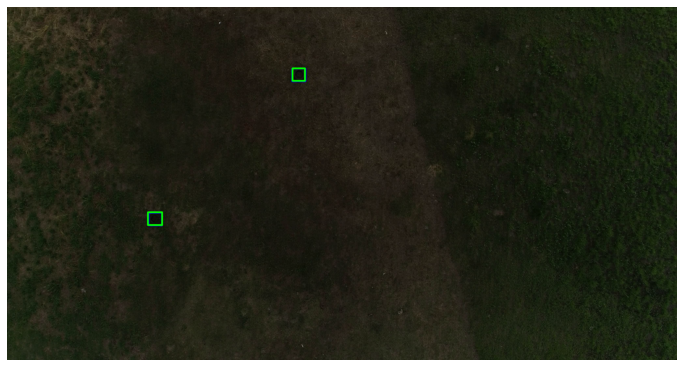

2832
{'tire-001': [856, 1750, 937, 1827], 'tire-004': [1731, 872, 1811, 950]}
Boxes(tensor([[ 847.5673, 1747.9923,  938.4433, 1823.7415],
        [1727.0808,  872.1057, 1803.8273,  951.0910]]))
tp=2, fp=0, fn=0


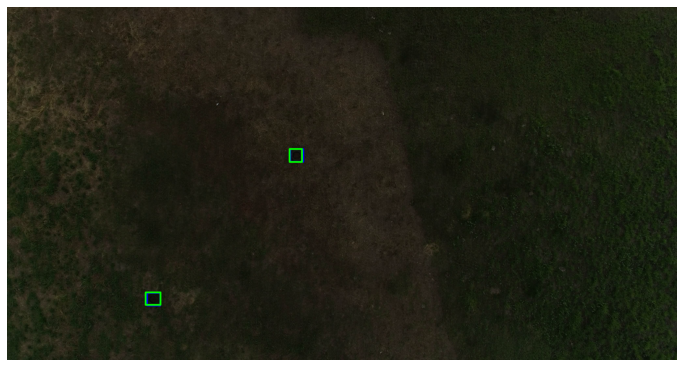

2856
{'tire-004': [1704, 1356, 1785, 1435]}
Boxes(tensor([[1707.8573, 1350.1897, 1784.7883, 1429.5613]]))
tp=1, fp=0, fn=0


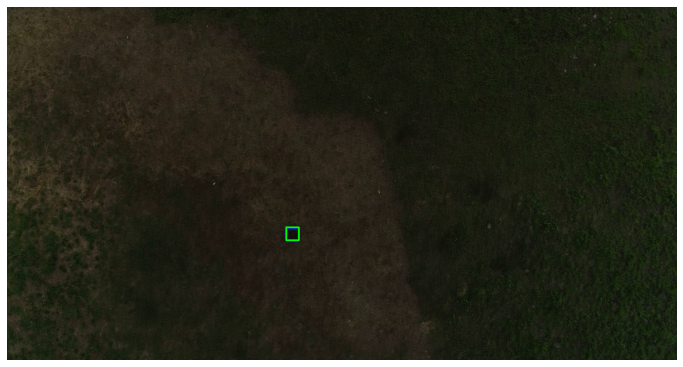

2880
{'tire-004': [1669, 1835, 1750, 1915]}
Boxes(tensor([[1665.3549, 1835.1552, 1745.5510, 1907.3209]]))
tp=1, fp=0, fn=0


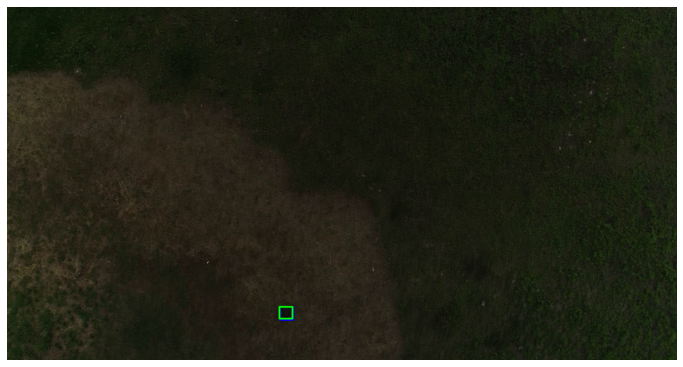

2952
{'tire-005': [3911, 311, 3995, 394]}
Boxes(tensor([], size=(0, 4)))
tp=0, fp=0, fn=1


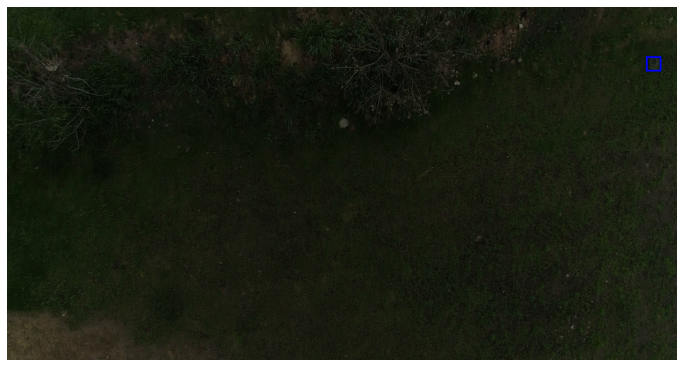

2976
{'tire-005': [3894, 787, 3978, 871]}
Boxes(tensor([], size=(0, 4)))
tp=0, fp=0, fn=1


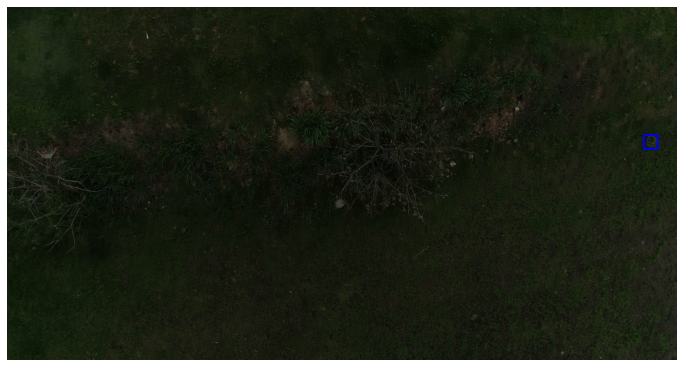

3000
{'tire-005': [3853, 1263, 3937, 1347]}
Boxes(tensor([], size=(0, 4)))
tp=0, fp=0, fn=1


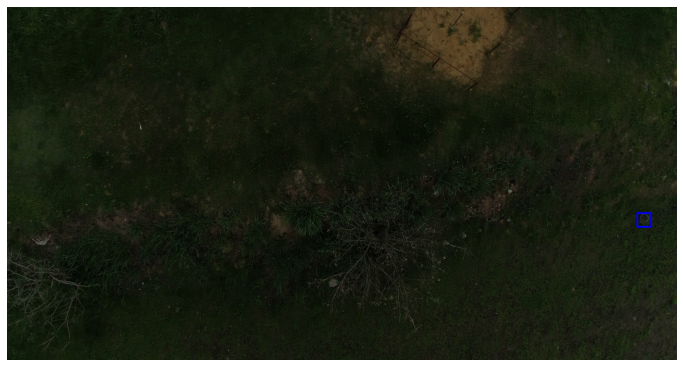

3024
{'tire-005': [3798, 1727, 3882, 1811]}
Boxes(tensor([], size=(0, 4)))
tp=0, fp=0, fn=1


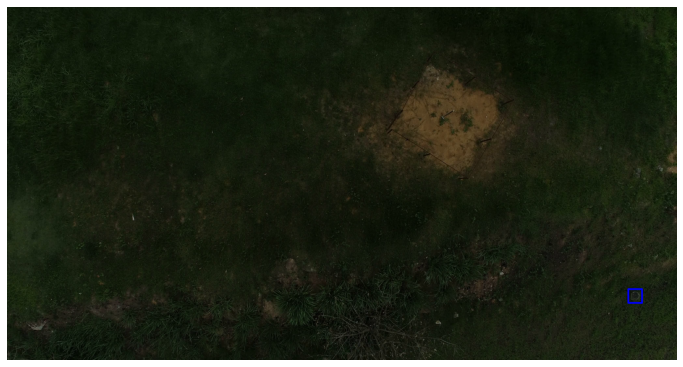

4224
{'tire-006': [1741, 1667, 1844, 1772], 'tire-007': [1672, 1708, 1779, 1805]}
Boxes(tensor([[1671.8489, 1711.0612, 1780.2142, 1804.2854]]))
tp=1, fp=0, fn=1


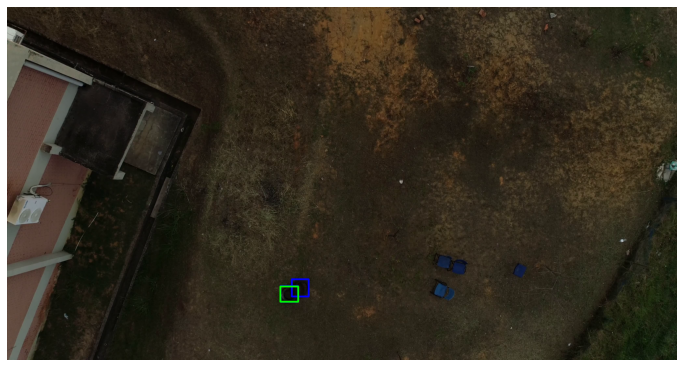

4248
{'tire-006': [1765, 1024, 1879, 1133], 'tire-007': [1709, 1068, 1816, 1167]}
Boxes(tensor([[1706.3475, 1061.4474, 1823.5010, 1160.1443]]))
tp=1, fp=0, fn=1


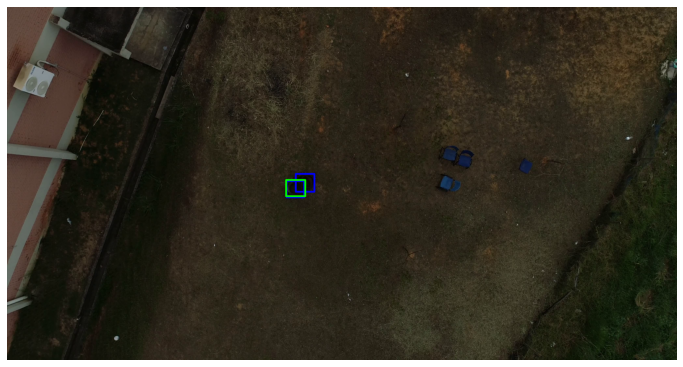

4272
{'tire-006': [1814, 369, 1922, 475], 'tire-007': [1745, 413, 1852, 513]}
Boxes(tensor([[1741.2174,  420.3755, 1858.4731,  509.9496],
        [1800.5786,  378.1340, 1916.1630,  474.6128]]))
tp=2, fp=0, fn=0


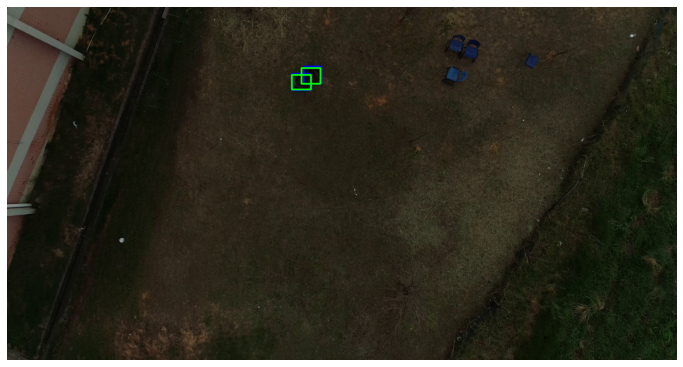

4776
{'tire-002': [3903, 1863, 3970, 1929]}
Boxes(tensor([[3891.1372, 1857.4069, 3962.6309, 1929.9861]]))
tp=1, fp=0, fn=0


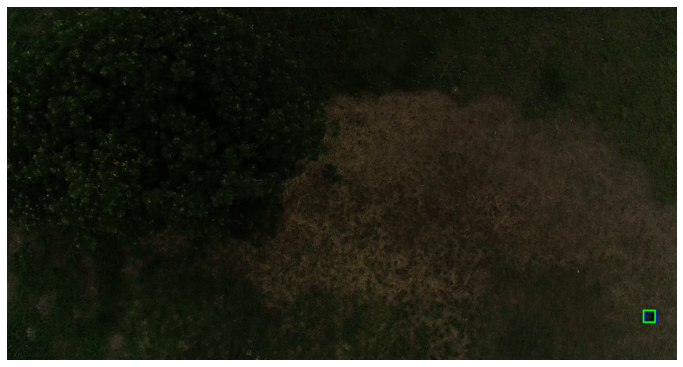

4800
{'tire-002': [3946, 1391, 4014, 1460]}
Boxes(tensor([[3940.8323, 1390.2800, 4009.9067, 1458.7743]]))
tp=1, fp=0, fn=0


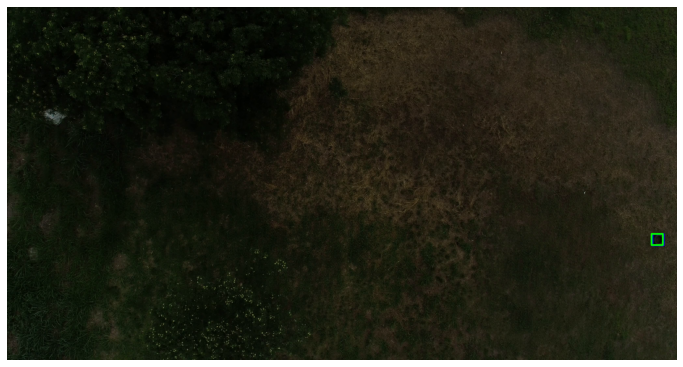

4824
{'tire-002': [3984, 917, 4052, 986], 'tire-003': [3179, 1779, 3252, 1854]}
Boxes(tensor([[3984.7322,  917.4788, 4048.7148,  985.2591],
        [3173.1553, 1780.6429, 3252.5613, 1855.2463]]))
tp=2, fp=0, fn=0


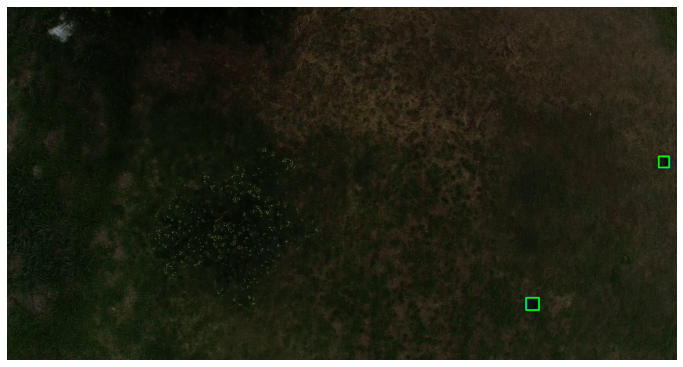

4848
{'tire-002': [4005, 447, 4073, 517], 'tire-003': [3214, 1298, 3287, 1372]}
Boxes(tensor([[3201.7795, 1298.0472, 3285.3279, 1371.8167],
        [4011.3958,  448.7368, 4072.2495,  509.2946]]))
tp=2, fp=0, fn=0


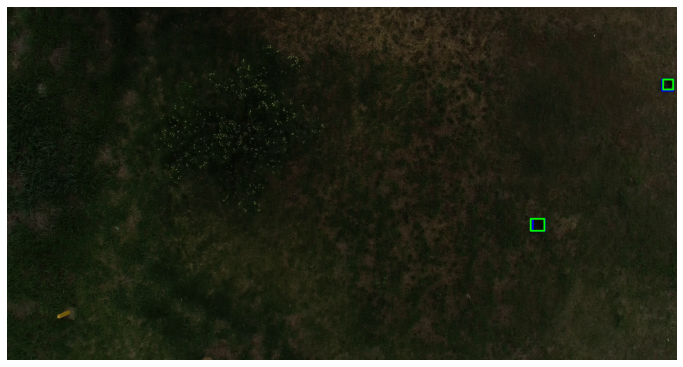

4872
{'tire-002': [4020, 0, 4088, 51], 'tire-003': [3243, 814, 3315, 889]}
Boxes(tensor([[3237.1379,  816.6382, 3313.6392,  888.5608],
        [4009.4482,    0.0000, 4086.0791,   52.8275]]))
tp=2, fp=0, fn=0


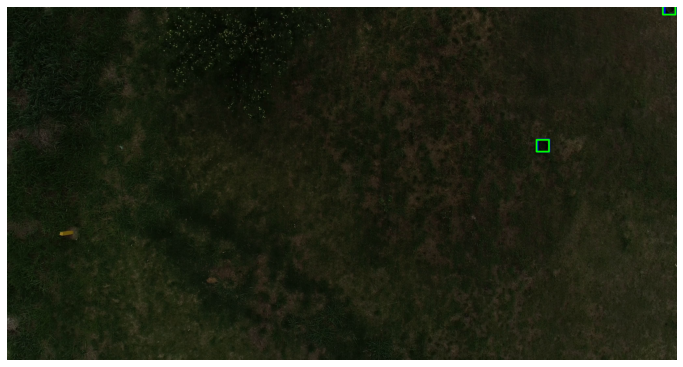

4896
{'tire-003': [3264, 329, 3336, 404]}
Boxes(tensor([[3253.4260,  329.9628, 3335.9529,  404.4993]]))
tp=1, fp=0, fn=0


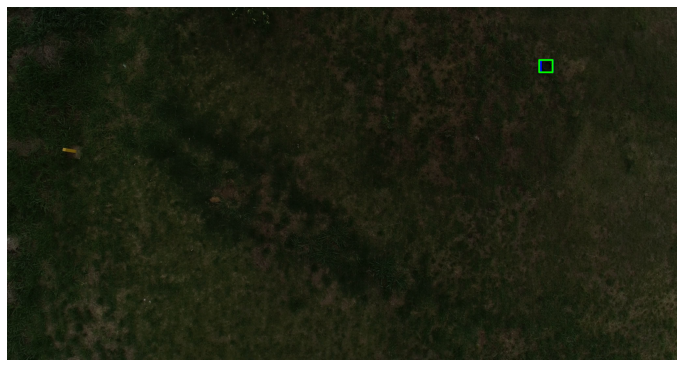

In [93]:
score_thr = 0.99

for frame_idx in range(vid.videoInfo.getNumberOfFrames()):
    
    if frame_idx % 24 == 0:       

        gt = vid.get_frame_annotations(frame_idx, objects=[f'{obj}'])       
        pred = get_pred_boxes_frame(preds_loaded, frame_idx)
        pred = filter_preds_score_image(pred, score_thr).get('pred_boxes').to(device='cpu')        
        
        if len(gt) == 0 and len(pred) == 0:
            continue
        
        _, img, _ = vid.get_frame(frame_idx)
        
        tp, fp, fn, index = CfnMat._cnf_mat(0, pred, make_boxes(gt))
        print(frame_idx)
        print(gt)
        print(pred)
        print(f'tp={tp}, fp={fp}, fn={fn}')
      
        

        plt.figure(figsize=(12,8))

        img = add_bboxes_on_image(img, gt, color=(0,0,255), thickness=10)
        img = add_bboxes_on_image(img, pred, color=(0,255,0), thickness=10)

        plt.imshow(img[:,:,::-1])
        plt.axis('off')
        plt.show()

In [94]:
score_thr = 0.99
min_votes = 0.4

preds = filter_preds_score_video(preds_loaded, score_thr)
preds_copy = copy.deepcopy(preds)

phase_corr_file = (f"../data/phase_correlation/{video_name}_phaseCorr.pkl")
with open(phase_corr_file, 'rb') as pkl_file:
    phase_corr = pickle.load(pkl_file)
    
height = vid.videoInfo.getHeight()
width = vid.videoInfo.getWidth()

pipes = tube_space_time(preds_copy, phase_corr, h=height, w=width)
filtered_pipes = filter_pipes(pipes, cut_exts=0, thr=min_votes)
preds_time = pipe_to_frame_instances(filtered_pipes, vid)

In [95]:
margin=(0,0)
for frame_idx in range(vid.videoInfo.getNumberOfFrames()):
    
    
    
    if frame_idx % 2544 == 0:       

        gt = vid.get_frame_annotations(frame_idx, objects=[f'{obj}'])       
        pred = get_pred_boxes_frame(preds_time, frame_idx)
        pred = filter_preds_score_image(pred, score_thr).get('pred_boxes').to(device='cpu')   
        
        gt = filter_gt_margin_image(gt, (height, width), margin)

        
        
        if len(gt) == 0 and len(pred) == 0:
            continue
        
        _, img, _ = vid.get_frame(frame_idx)
        
        tp, fp, fn, index = CfnMat._cnf_mat(0, pred, make_boxes(gt))
        
        print(frame_idx)
        print(gt)
        print(pred)
        print(f'tp={tp}, fp={fp}, fn={fn}')

        plt.figure(figsize=(12,8))
        
        
        img = add_bboxes_on_image(img, gt, color=(0,0,255), thickness=10)
        
        
#         if len(index) != 0:

        pred_right = pred[index > 0]
        pred_wrong = pred[index == 0]
        
        print(index)

        img = add_bboxes_on_image(img, pred_right, color=(0,255,0), thickness=10)
        img = add_bboxes_on_image(img, pred_wrong, color=(255,0,0), thickness=10)
        
        
        
#         plt.axis('off')

        plt.imshow(img[:,:,::-1])
        plt.show()
        
        plt.figure(figsize=(3,4))                
        plt.imshow(img[100:300,200:500,::-1])
        plt.axis('off')
        plt.show()

In [42]:
from detectron2.utils.visualizer import Visualizer

In [43]:
dict_colors = {'watertank': 'cyan',
               'tire': 'brown',
               'pool': 'salmon',
               'bottle': 'purple',
               'bucket': 'gold',
               'puddle': 'olive',
              }

In [34]:
obj = 'bucket'
frame_idx = 870
gt = vid.get_frame_annotations(frame_idx)   
_, img, _ = vid.get_frame(frame_idx)

gt_ = make_boxes(gt)
labels_ = get_labels(gt)
box_colors = [dict_colors[o] for o in labels_]

In [20]:
v = Visualizer(img[:,:,::-1])
v.overlay_instances(boxes=gt_, labels=labels_, alpha=1.0, assigned_colors=box_colors)
v = v.get_output()

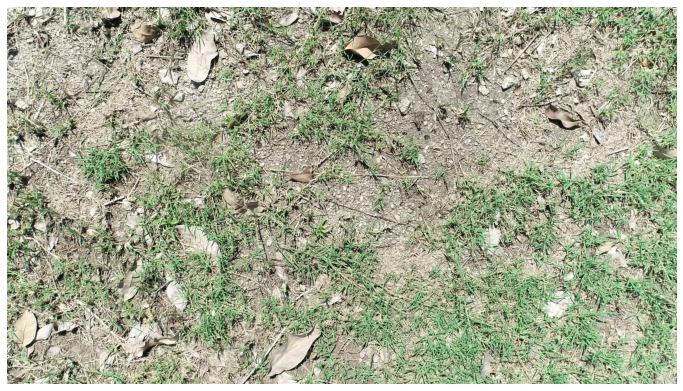

In [21]:
img =  v.get_image()
plt.figure(figsize=(12,8))
plt.imshow(img)
plt.axis('off')
plt.show()

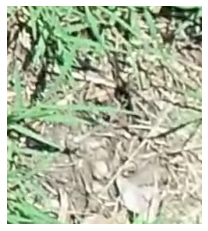

In [22]:
# plt.figure(figsize=(3,4))
plt.imshow(img[1620:1900,3350:3600,:])
plt.axis('off')
plt.show()

In [ ]:
img.shape